# 🖼️ Notebook 3 — Preprocessing & Augmentation Experiments
**Pill Counter | Computer Vision Pipeline**

> **Goal:** Systematically evaluate every preprocessing operation and augmentation strategy on sample images before committing them to the training pipeline. Each experiment is self-contained.

---
**Sections:**
1. Imports & helpers
2. Resize strategies — letterbox vs stretch
3. Noise reduction comparison
4. Brightness normalisation (CLAHE vs plain histogram equalisation)
5. Augmentation grid — rotation, flip, scale, HSV jitter, mosaic, noise
6. Pipeline composition — pick and stack what works


## 3.1 — Imports & Helpers

In [1]:
import cv2, yaml, random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

plt.rcParams["figure.dpi"] = 120

with open("config.yaml") as f:
    CFG = yaml.safe_load(f)

DATA_DIR = Path(CFG["paths"]["raw_data"])
IMG_SIZE = CFG["dataset"]["img_size"]

# ── Load a small bank of real sample images ──
sample_paths = list(DATA_DIR.rglob("*.jpg"))[:20] + list(DATA_DIR.rglob("*.png"))[:10]
SAMPLES = [cv2.imread(str(p)) for p in sample_paths if cv2.imread(str(p)) is not None][:8]

if not SAMPLES:
    # Synthetic fallback so the notebook is runnable without data
    print("⚠️  No real images found — using synthetic test images.")
    SAMPLES = [np.random.randint(80, 220, (480, 640, 3), dtype=np.uint8) for _ in range(8)]

print(f"Working with {len(SAMPLES)} sample image(s)")

def show_pair(orig, result, title_orig="Original", title_result="Result", figsize=(10,4)):
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    axes[0].imshow(cv2.cvtColor(orig,   cv2.COLOR_BGR2RGB)); axes[0].set_title(title_orig);   axes[0].axis("off")
    axes[1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)); axes[1].set_title(title_result); axes[1].axis("off")
    plt.tight_layout(); plt.show()

def show_grid(images, titles, cols=4, figsize=(16,8)):
    rows = -(-len(images)//cols)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten() if rows > 1 else [axes] if len(images)==1 else list(axes)
    for ax, img, t in zip(axes, images, titles):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if len(img.shape)==3 else img, cmap="gray")
        ax.set_title(t, fontsize=8); ax.axis("off")
    for ax in axes[len(images):]: ax.axis("off")
    plt.tight_layout(); plt.show()


⚠️  No real images found — using synthetic test images.
Working with 8 sample image(s)


## 3.2 — Resize Strategies

> **Experiment:** Compare simple stretch vs letterbox padding. Letterbox preserves aspect ratio — important when pills can be elongated or pill shapes are class-distinctive.

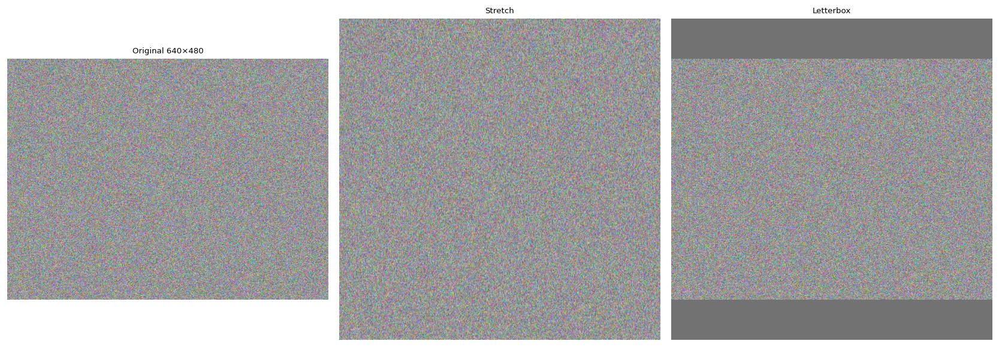

📝  Recommendation: YOLOv8 uses letterbox internally.
    Use stretch only if all source images are already square.


In [2]:
def resize_stretch(img, size):
    return cv2.resize(img, (size, size), interpolation=cv2.INTER_LINEAR)

def resize_letterbox(img, size, pad_color=(114, 114, 114)):
    h, w = img.shape[:2]
    scale = size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    resized = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_LINEAR)
    canvas = np.full((size, size, 3), pad_color, dtype=np.uint8)
    top  = (size - nh) // 2
    left = (size - nw) // 2
    canvas[top:top+nh, left:left+nw] = resized
    return canvas

img = SAMPLES[0]
stretched  = resize_stretch(img,    IMG_SIZE)
letterboxed = resize_letterbox(img, IMG_SIZE)

show_grid(
    [img, stretched, letterboxed],
    [f"Original {img.shape[1]}×{img.shape[0]}", "Stretch", "Letterbox"],
    cols=3, figsize=(14, 5)
)

print("📝  Recommendation: YOLOv8 uses letterbox internally.")
print("    Use stretch only if all source images are already square.")


## 3.3 — Noise Reduction Comparison

> **Experiment:** Gaussian blur vs Median filter vs Bilateral filter. Bilateral is edge-preserving — preferred for object detection where edge sharpness matters.

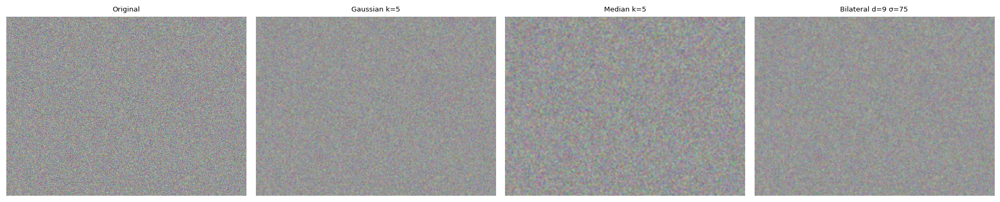

Sharpness scores (Laplacian variance — higher is sharper):
  Original  : 14644.7
  Gaussian  : 63.5
  Median    : 262.5
  Bilateral : 3620.7

📝  Bilateral preserves edges best → recommended for pill boundary detection.


In [3]:
img = SAMPLES[0]

gaussian  = cv2.GaussianBlur(img, (5, 5), 0)
median    = cv2.medianBlur(img, 5)
bilateral = cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

show_grid(
    [img, gaussian, median, bilateral],
    ["Original", "Gaussian k=5", "Median k=5", "Bilateral d=9 σ=75"],
    cols=4, figsize=(16, 5)
)

# Sharpness proxy: Laplacian variance (higher = sharper)
def sharpness(im): return cv2.Laplacian(cv2.cvtColor(im, cv2.COLOR_BGR2GRAY), cv2.CV_64F).var()

print(f"Sharpness scores (Laplacian variance — higher is sharper):")
print(f"  Original  : {sharpness(img):.1f}")
print(f"  Gaussian  : {sharpness(gaussian):.1f}")
print(f"  Median    : {sharpness(median):.1f}")
print(f"  Bilateral : {sharpness(bilateral):.1f}")
print("\n📝  Bilateral preserves edges best → recommended for pill boundary detection.")


## 3.4 — Brightness Normalisation

> **Experiment:** Plain histogram equalisation vs CLAHE. CLAHE applies equalisation locally with contrast clipping to avoid over-amplifying noise in uniform regions.

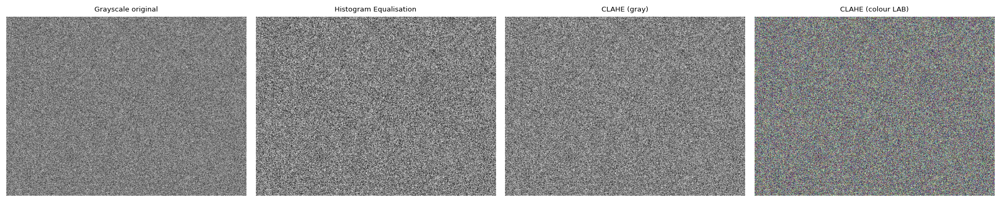

📝  CLAHE colour (LAB) recommended — avoids hue distortion while normalising luminance.


In [4]:
img = SAMPLES[0]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Plain HE
he = cv2.equalizeHist(gray)

# CLAHE
clahe_op = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_result = clahe_op.apply(gray)

# Colour CLAHE via LAB
lab  = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)
l = clahe_op.apply(l)
colour_clahe = cv2.cvtColor(cv2.merge([l, a, b]), cv2.COLOR_LAB2BGR)

show_grid(
    [gray, he, clahe_result, colour_clahe],
    ["Grayscale original", "Histogram Equalisation", "CLAHE (gray)", "CLAHE (colour LAB)"],
    cols=4, figsize=(16, 5)
)
print("📝  CLAHE colour (LAB) recommended — avoids hue distortion while normalising luminance.")


## 3.5 — Augmentation Grid

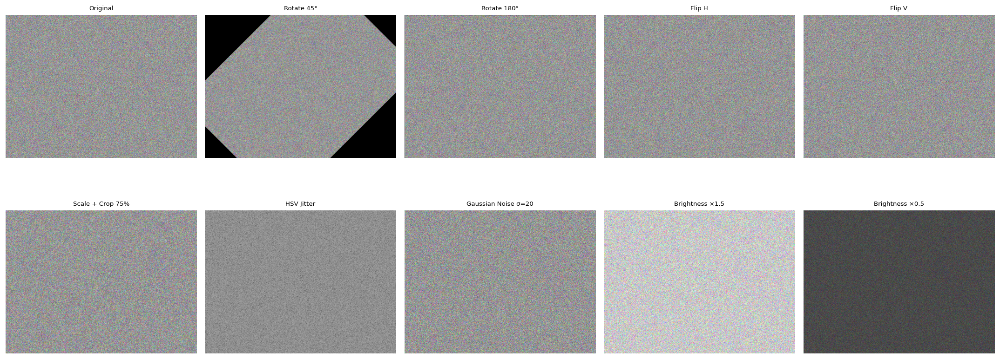

In [5]:
img = SAMPLES[0]

# ── Individual augmentations ──

def rotate(im, angle):
    h, w = im.shape[:2]
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1.0)
    return cv2.warpAffine(im, M, (w, h))

def flip_h(im):   return cv2.flip(im, 1)
def flip_v(im):   return cv2.flip(im, 0)

def scale_crop(im, scale=0.8):
    h, w = im.shape[:2]
    nh, nw = int(h*scale), int(w*scale)
    top = (h-nh)//2; left = (w-nw)//2
    cropped = im[top:top+nh, left:left+nw]
    return cv2.resize(cropped, (w, h))

def hsv_jitter(im, h_gain=0.015, s_gain=0.7, v_gain=0.4):
    hsv = im.astype(np.float32)
    hsv = cv2.cvtColor(hsv, cv2.COLOR_BGR2HSV)
    hsv[..., 0] = np.clip(hsv[..., 0] * (1 + h_gain * (random.random()*2-1)), 0, 179)
    hsv[..., 1] = np.clip(hsv[..., 1] * (1 + s_gain * (random.random()*2-1)), 0, 255)
    hsv[..., 2] = np.clip(hsv[..., 2] * (1 + v_gain * (random.random()*2-1)), 0, 255)
    return cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2BGR)

def add_gaussian_noise(im, sigma=15):
    noise = np.random.normal(0, sigma, im.shape).astype(np.float32)
    return np.clip(im.astype(np.float32) + noise, 0, 255).astype(np.uint8)

def brightness(im, factor=1.4):
    hsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV).astype(np.float32)
    hsv[..., 2] = np.clip(hsv[..., 2] * factor, 0, 255)
    return cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2BGR)

augs = [
    (img,                           "Original"),
    (rotate(img, 45),               "Rotate 45°"),
    (rotate(img, 180),              "Rotate 180°"),
    (flip_h(img),                   "Flip H"),
    (flip_v(img),                   "Flip V"),
    (scale_crop(img, 0.75),         "Scale + Crop 75%"),
    (hsv_jitter(img),               "HSV Jitter"),
    (add_gaussian_noise(img, 20),   "Gaussian Noise σ=20"),
    (brightness(img, 1.5),          "Brightness ×1.5"),
    (brightness(img, 0.5),          "Brightness ×0.5"),
]

show_grid([a[0] for a in augs], [a[1] for a in augs], cols=5, figsize=(18, 8))
plt.savefig = lambda *a, **k: None  # suppress duplicate saves in loop


## 3.6 — Full Preprocessing Pipeline

> Compose the chosen operations and apply to all 8 samples to visually confirm the pipeline is sane before training.

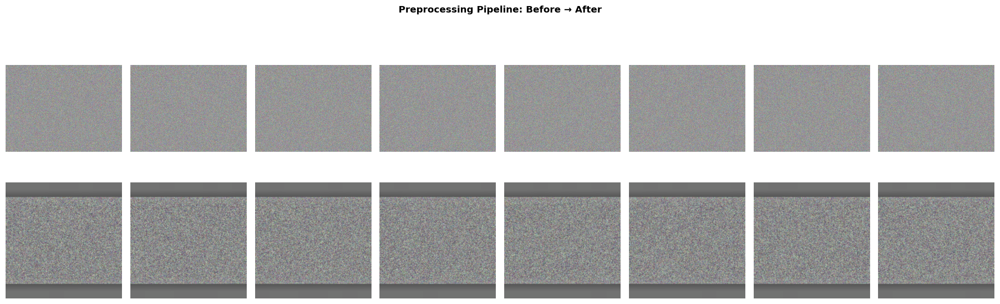

All outputs: 640×640


In [6]:
from functools import partial

def full_pipeline(img: np.ndarray, size: int = IMG_SIZE,
                  do_bilateral: bool = True, do_clahe: bool = True) -> np.ndarray:
    """
    Recommended preprocessing pipeline:
    1. Letterbox resize
    2. Bilateral filter  (edge-preserving denoise)
    3. CLAHE colour normalisation
    """
    # Step 1 — resize
    h, w = img.shape[:2]
    scale = size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    resized = cv2.resize(img, (nw, nh), cv2.INTER_LINEAR)
    canvas = np.full((size, size, 3), 114, dtype=np.uint8)
    top, left = (size-nh)//2, (size-nw)//2
    canvas[top:top+nh, left:left+nw] = resized

    # Step 2 — bilateral denoise
    if do_bilateral:
        canvas = cv2.bilateralFilter(canvas, 9, 75, 75)

    # Step 3 — CLAHE colour normalisation
    if do_clahe:
        lab = cv2.cvtColor(canvas, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe_op = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        canvas = cv2.cvtColor(cv2.merge([clahe_op.apply(l), a, b]), cv2.COLOR_LAB2BGR)

    return canvas


# Apply to all samples
processed = [full_pipeline(s) for s in SAMPLES]

fig, axes = plt.subplots(2, len(SAMPLES), figsize=(18, 6))
fig.suptitle("Preprocessing Pipeline: Before → After", fontsize=12, fontweight="bold")
for i, (orig, proc) in enumerate(zip(SAMPLES, processed)):
    axes[0, i].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)); axes[0, i].axis("off")
    axes[1, i].imshow(cv2.cvtColor(proc, cv2.COLOR_BGR2RGB)); axes[1, i].axis("off")
axes[0, 0].set_ylabel("Original", fontsize=9)
axes[1, 0].set_ylabel("Processed", fontsize=9)

plt.tight_layout()
plt.savefig("results/visualizations/preprocessing_pipeline.png", bbox_inches="tight")
plt.show()
print(f"All outputs: {IMG_SIZE}×{IMG_SIZE}")


## ✅  Notebook 3 Complete
> Pipeline validated. Proceed to **Notebook 4 — Model Training**.